# **Hi! Paris Hackathon**


<span style="color:red">
DO NOT FORGET:
</span>

**Pipeline:** dans l'ensemble de validation, ajouter beaucoup de summer (puisque focus sur le summer). Puis, avant la final prediction, d'entraîner sur tout l'ensemble de train, 

# Group 21: AI & Sustainability

The goal is to build an AI model that can predict the watertable/ground water levels of french piezometric stations, with a focus on the summer months. To build this model, you were given piezometric/watertable, weather, hydrology, water withdrawal and economic data. But beyond producing an AI model, the competition will ask you to realistically project your solution in a market / real-world context.

The full dataset contains over 3 million rows with 136 columns. It was split into a train/test set.
- Train set (X_train_Hi5.csv): The dataset has around 2 800 000 rows. It contains data between 2020 and 2023, excluding the summer months (june, july, august, september) of 2022 and 2023.
- Test set (X_test_Hi5.csv): The contains has around 600 000 rows. It contains data for the 2022 and 2023 summer months (june, july, august, september).
- Test submission example (y_test_submission_example_Hi5.csv): Please follow this example to submit results to the leaderboard. The "row_index" variable is a unique identifier of each row, to match the values

The target variable to predict is piezo_groundwater_level_category.


---

## Import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns
import numpy as np

In [2]:
train = pd.read_csv('X_train_Hi5.csv') 
test = pd.read_csv('X_test_Hi5.csv')

# train = pd.read_csv('X_train_Hi5.csv', nrows=50_000)  # Load the entire dataset
# test = pd.read_csv('X_test_Hi5.csv', nrows=10_000)    # Load the entire dataset

C:\Users\Bradf\AppData\Local\Temp\ipykernel_22388\1624681743.py:1: DtypeWarning: Columns (108,110,111,115,117,118,122,124,125) have mixed types. Specify dtype option on import or set low_memory=False.
  train = pd.read_csv('X_train_Hi5.csv')
C:\Users\Bradf\AppData\Local\Temp\ipykernel_22388\1624681743.py:2: DtypeWarning: Columns (1,5,108,110,111,115,117,118,122,124,125) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv('X_test_Hi5.csv')


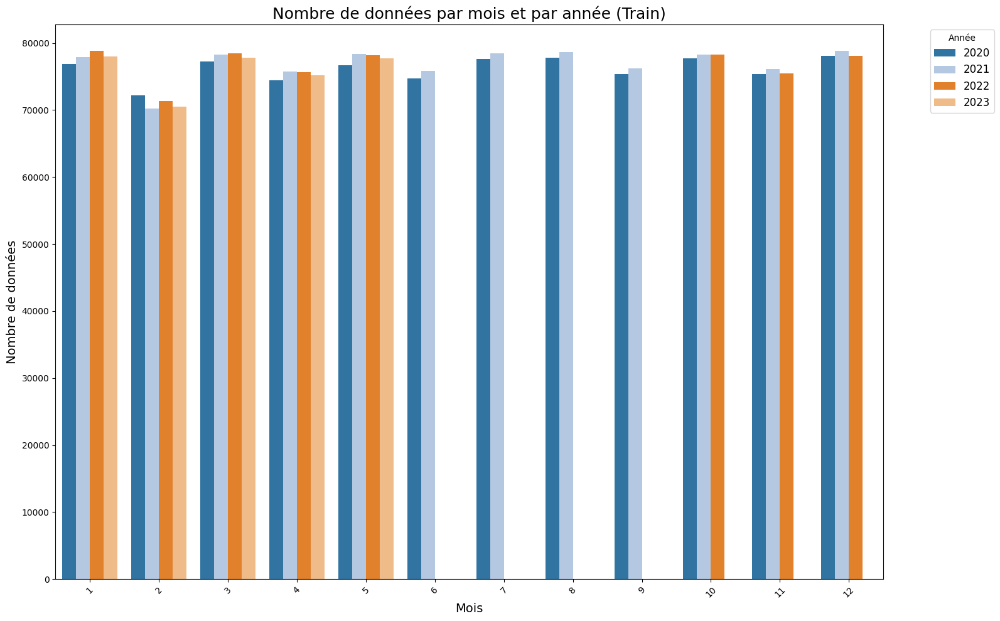

C:\Users\Bradf\AppData\Local\Temp\ipykernel_25656\4175438656.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_per_month, x='month', y='counts', palette='Blues_d')


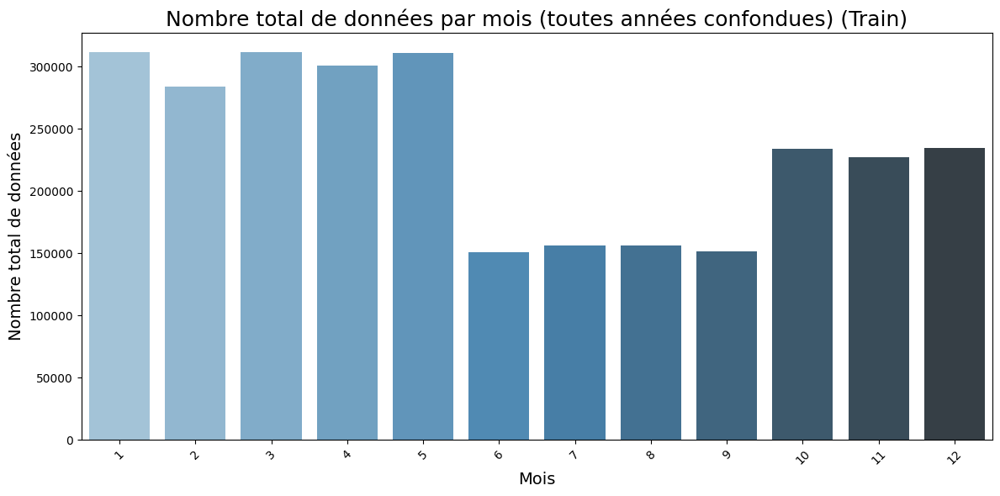

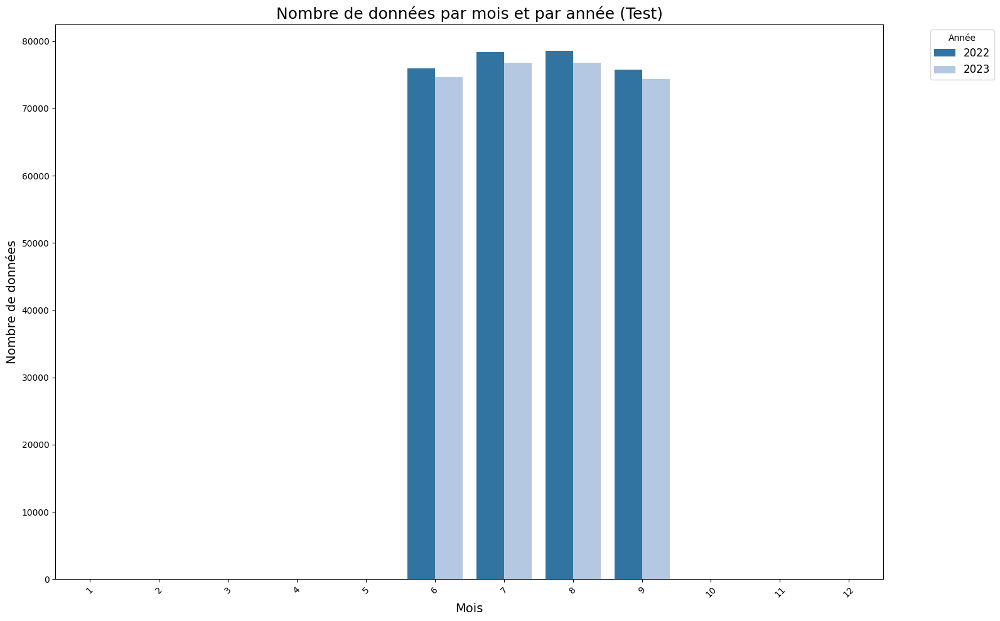

C:\Users\Bradf\AppData\Local\Temp\ipykernel_25656\4175438656.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_per_month, x='month', y='counts', palette='Blues_d')


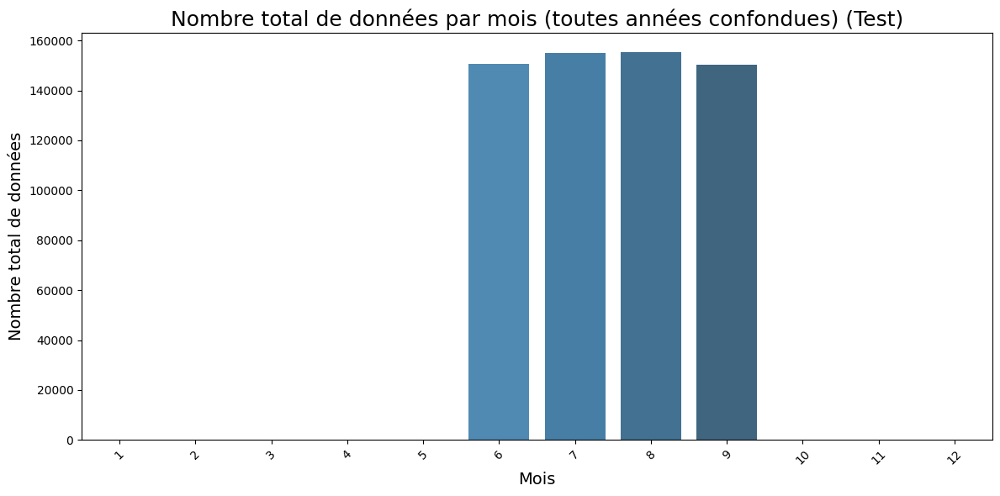

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assurer que la colonne de date est au bon format
train['piezo_measurement_date'] = pd.to_datetime(train['piezo_measurement_date'], errors='coerce')
test['piezo_measurement_date'] = pd.to_datetime(test['piezo_measurement_date'], errors='coerce')

def plot_monthly_data_counts(df, dataset_name):
    # Extraire l'année et le mois
    df['year'] = df['piezo_measurement_date'].dt.year
    df['month'] = df['piezo_measurement_date'].dt.month

    # Créer une grille complète de toutes les combinaisons année-mois
    all_years = sorted(df['year'].dropna().unique())
    all_months = range(1, 13)
    all_combinations = pd.MultiIndex.from_product([all_years, all_months], names=['year', 'month']).to_frame(index=False)

    # Compter le nombre de données par mois et par année
    data_counts = df.groupby(['year', 'month']).size().reset_index(name='counts')

    # Fusionner pour inclure les mois sans données
    data_counts_full = pd.merge(all_combinations, data_counts, on=['year', 'month'], how='left').fillna(0)
    data_counts_full['counts'] = data_counts_full['counts'].astype(int)

    # Tracer le nombre de données par mois et par année
    plt.figure(figsize=(16, 10))
    sns.barplot(data=data_counts_full, x='month', y='counts', hue='year', palette='tab20')
    plt.title(f'Nombre de données par mois et par année ({dataset_name})', fontsize=18)
    plt.xlabel('Mois', fontsize=14)
    plt.ylabel('Nombre de données', fontsize=14)
    plt.legend(title='Année', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Calculer le total des données par mois sur toutes les années
    total_per_month = data_counts_full.groupby('month')['counts'].sum().reset_index()

    # Tracer le total des données par mois
    plt.figure(figsize=(12, 6))
    sns.barplot(data=total_per_month, x='month', y='counts', palette='Blues_d')
    plt.title(f'Nombre total de données par mois (toutes années confondues) ({dataset_name})', fontsize=18)
    plt.xlabel('Mois', fontsize=14)
    plt.ylabel('Nombre total de données', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Appliquer la fonction aux datasets train et test
plot_monthly_data_counts(train, 'Train')
plot_monthly_data_counts(test, 'Test')

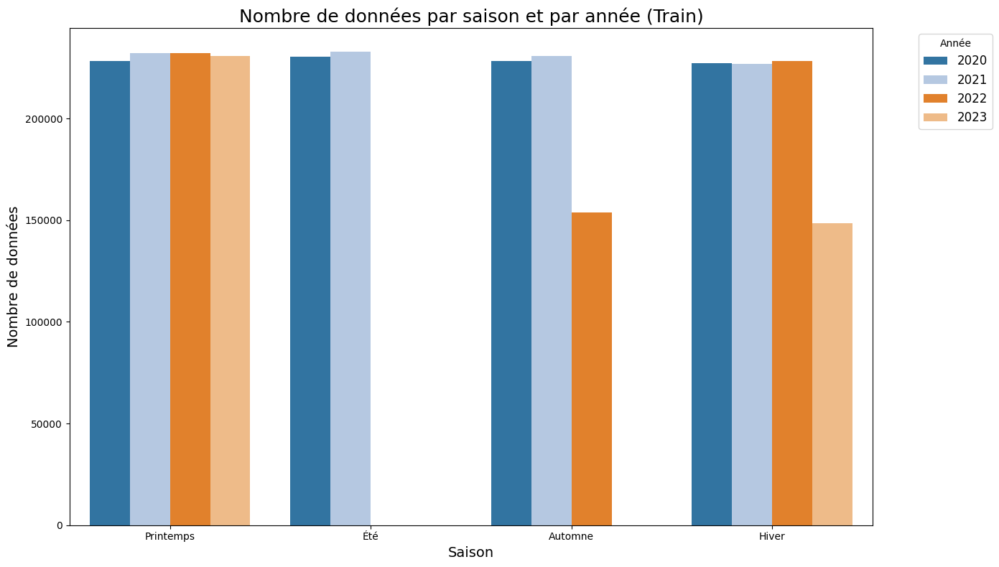

C:\Users\Bradf\AppData\Local\Temp\ipykernel_25656\1829944342.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_per_season, x='season', y='counts', palette='Blues_d')


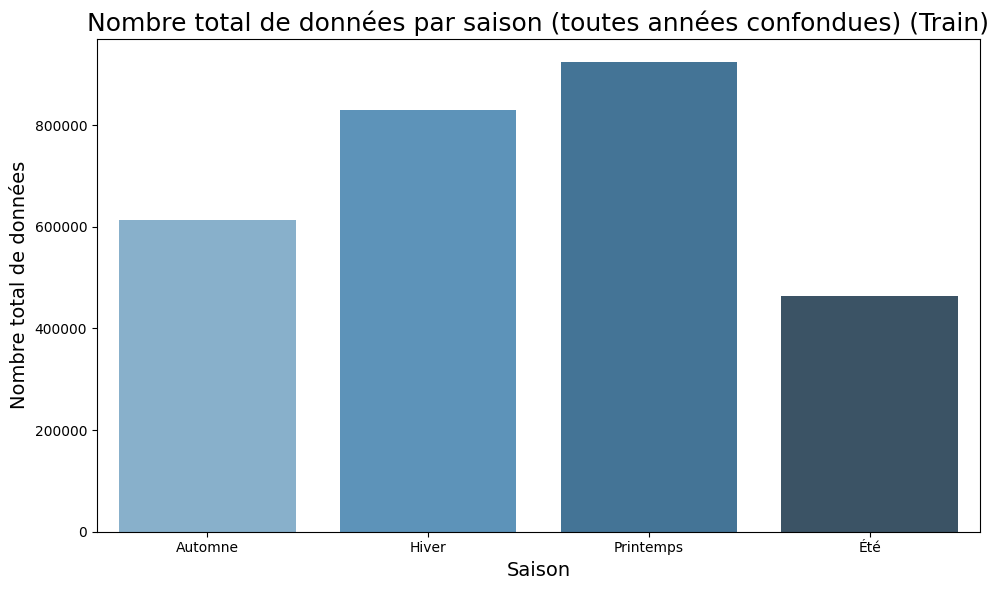

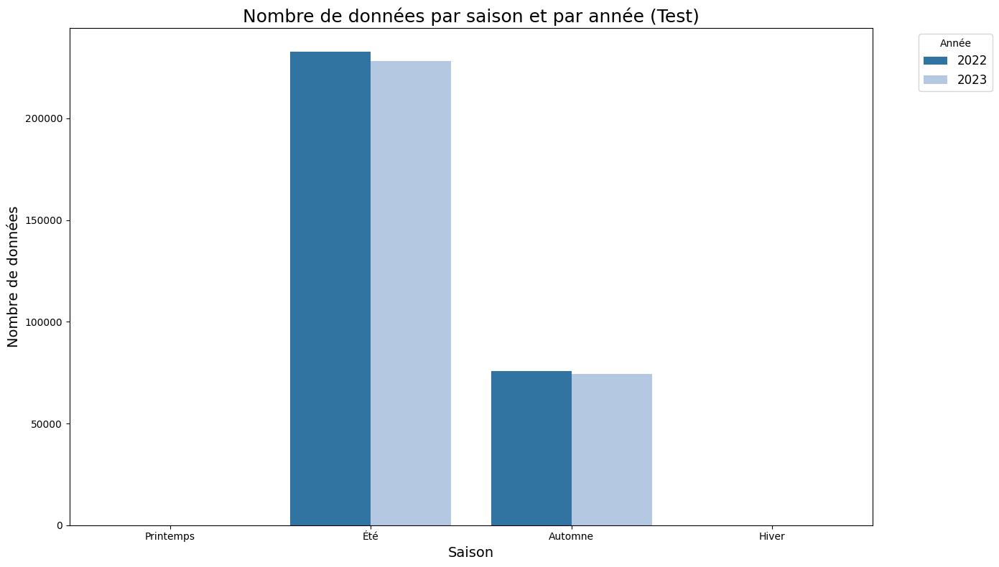

C:\Users\Bradf\AppData\Local\Temp\ipykernel_25656\1829944342.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_per_season, x='season', y='counts', palette='Blues_d')


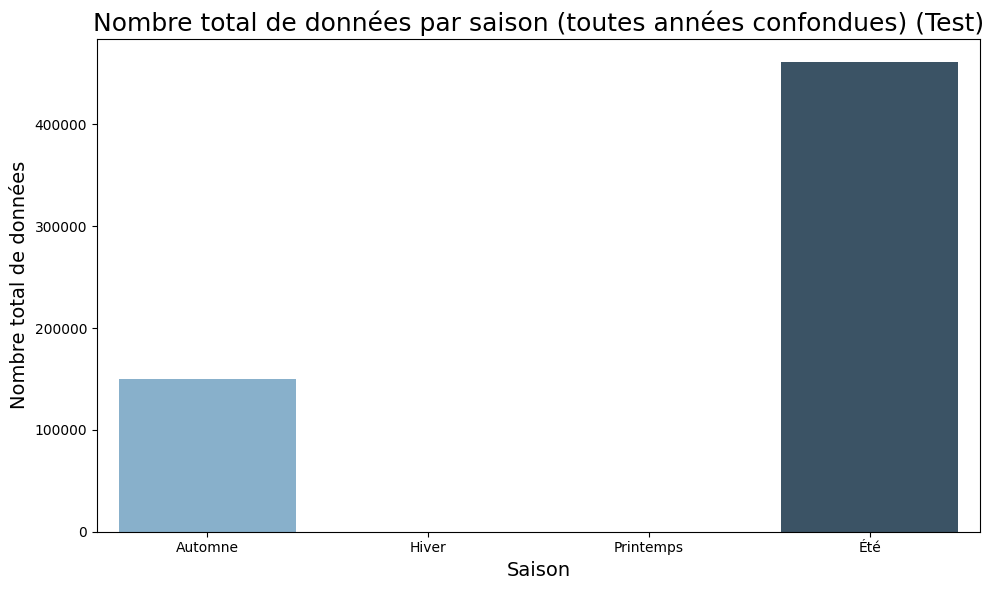

In [15]:
def assign_season(month):
    if month in [3, 4, 5]:
        return 'Printemps'
    elif month in [6, 7, 8]:
        return 'Été'
    elif month in [9, 10, 11]:
        return 'Automne'
    elif month in [12, 1, 2]:
        return 'Hiver'
    else:
        return 'Inconnu'

def plot_seasonal_data_counts(df, dataset_name):
    # Extraire l'année et le mois
    df['year'] = df['piezo_measurement_date'].dt.year
    df['month'] = df['piezo_measurement_date'].dt.month

    # Assigner une saison
    df['season'] = df['month'].apply(assign_season)

    # Créer une grille complète de toutes les combinaisons année-saison
    all_years = sorted(df['year'].dropna().unique())
    seasons = ['Printemps', 'Été', 'Automne', 'Hiver']
    all_combinations = pd.MultiIndex.from_product([all_years, seasons], names=['year', 'season']).to_frame(index=False)

    # Compter le nombre de données par saison et par année
    data_counts = df.groupby(['year', 'season']).size().reset_index(name='counts')

    # Fusionner pour inclure les saisons sans données
    data_counts_full = pd.merge(all_combinations, data_counts, on=['year', 'season'], how='left').fillna(0)
    data_counts_full['counts'] = data_counts_full['counts'].astype(int)

    # Tracer le nombre de données par saison et par année
    plt.figure(figsize=(14, 8))
    sns.barplot(data=data_counts_full, x='season', y='counts', hue='year', palette='tab20')
    plt.title(f'Nombre de données par saison et par année ({dataset_name})', fontsize=18)
    plt.xlabel('Saison', fontsize=14)
    plt.ylabel('Nombre de données', fontsize=14)
    plt.legend(title='Année', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Calculer le total des données par saison sur toutes les années
    total_per_season = data_counts_full.groupby('season')['counts'].sum().reset_index()

    # Tracer le total des données par saison
    plt.figure(figsize=(10, 6))
    sns.barplot(data=total_per_season, x='season', y='counts', palette='Blues_d')
    plt.title(f'Nombre total de données par saison (toutes années confondues) ({dataset_name})', fontsize=18)
    plt.xlabel('Saison', fontsize=14)
    plt.ylabel('Nombre total de données', fontsize=14)
    plt.tight_layout()
    plt.show()

# Appliquer la fonction aux datasets train et test
plot_seasonal_data_counts(train, 'Train')
plot_seasonal_data_counts(test, 'Test')


In [3]:
# number of numerical and categorical columns

numerical_cols = train.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = train.select_dtypes(include=['object']).columns

numerical_cols_test = test.select_dtypes(include=['float64', 'int64']).columns
categorical_cols_test = test.select_dtypes(include=['object']).columns

print(f"Train set has {train.shape[0]} rows and {train.shape[1]} columns")
print(f"Test set has {test.shape[0]} rows and {test.shape[1]} columns")
print(f"Train set has {len(numerical_cols)} numerical columns and {len(categorical_cols)} categorical columns")
print(f"Test set has {len(numerical_cols_test)} numerical columns and {len(categorical_cols_test)} categorical columns")

Train set has 2830316 rows and 136 columns
Test set has 611208 rows and 135 columns
Train set has 96 numerical columns and 40 categorical columns
Test set has 96 numerical columns and 39 categorical columns


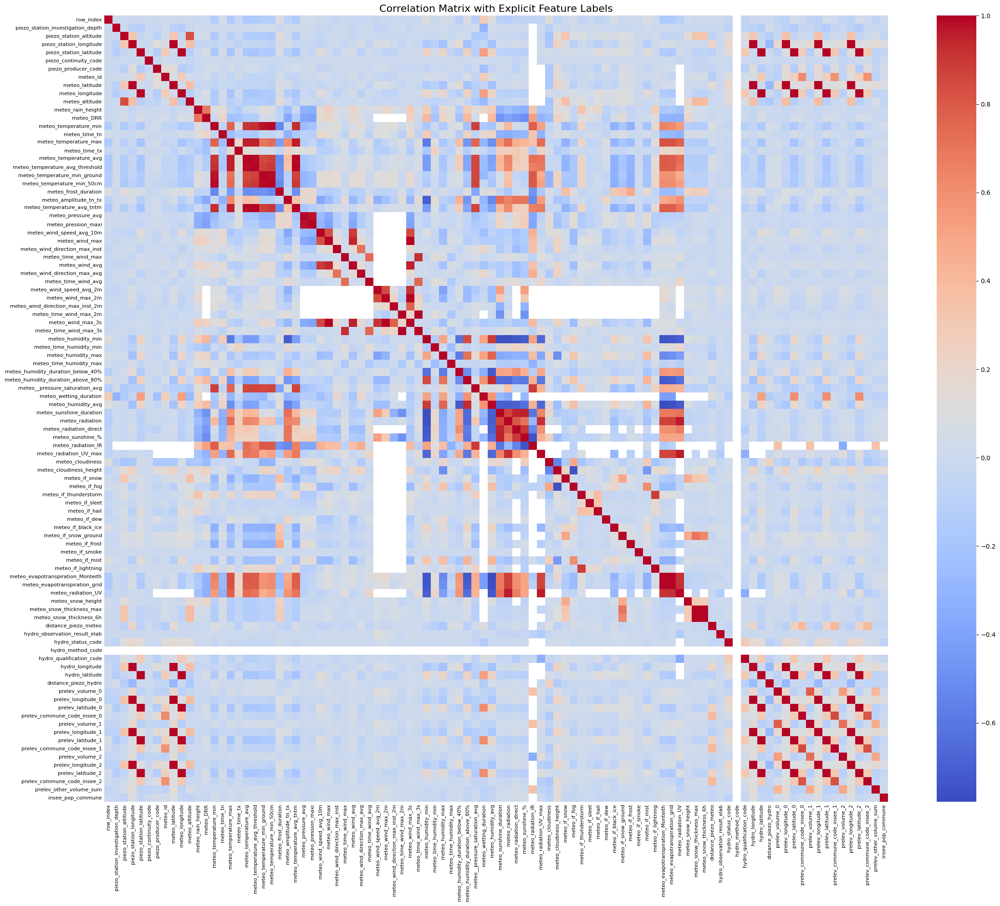

In [4]:
# Calculer la matrice de corrélation uniquement pour les colonnes numériques
numeric_features = train.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = train[numeric_features].corr()

plt.figure(figsize=(24, 20))  # Taille augmentée pour mieux répartir les éléments
ax = sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', fmt=".2f", cbar=True)

# Ajuster les ticks pour inclure tous les noms
ax.set_xticks(np.arange(len(corr_matrix.columns)) + 0.5)  # Centrer les ticks
ax.set_yticks(np.arange(len(corr_matrix.index)) + 0.5)
ax.set_xticklabels(corr_matrix.columns, rotation=90, fontsize=8)  # Tourner les noms à 90°
ax.set_yticklabels(corr_matrix.index, rotation=0, fontsize=8)

# Forcer les limites
ax.tick_params(axis='x', which='both', length=0)  # Supprime les lignes de ticks pour rendre plus propre
ax.tick_params(axis='y', which='both', length=0)

plt.title('Correlation Matrix with Explicit Feature Labels', fontsize=16)
plt.tight_layout()
plt.show()

In [5]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.feature_selection import SelectFromModel

# X_train = train.drop('piezo_groundwater_level_category', axis=1)
# y_train = train['piezo_groundwater_level_category']
# X_test = test

# from sklearn.impute import KNNImputer

# # Imputation par KNN
# knn_imputer = KNNImputer(n_neighbors=5)
# X_train_imputed = knn_imputer.fit_transform(X_train)
# X_test_imputed = knn_imputer.transform(X_test)


# from sklearn.linear_model import LogisticRegression
# from sklearn.feature_selection import SelectFromModel

# # Régularisation L1 (Lasso)
# lasso = LogisticRegression(penalty='l1', solver='saga', multi_class='multinomial', C=0.1, max_iter=1000)
# lasso.fit(X_train_imputed, y_train)

# # Sélectionner les features importantes
# model = SelectFromModel(lasso, prefit=True)
# X_train_selected = model.transform(X_train_imputed)
# X_test_selected = model.transform(X_test_imputed)

# # Voir les features sélectionnés
# selected_features = X_train.columns[model.get_support()]
# print("Features sélectionnés : ", selected_features)


In [6]:
# # Sample train and test

# train_sample = train.sample(frac=1, random_state=1).reset_index(drop=True)
# test_sample = test.sample(frac=1, random_state=1).reset_index(drop=True)

In [7]:
# print(train_sample.head())

In [ ]:
# Define a function to assign seasons based on the month
def assign_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return None
    
date_col = 'piezo_measurement_date'

# Correct the column names for longitude and latitude
longitude_col = 'piezo_station_longitude'
latitude_col = 'piezo_station_latitude'

# Extract year and month from the date column
train['update_year'] = pd.to_datetime(train[date_col], errors='coerce').dt.year
train['update_month'] = pd.to_datetime(train[date_col], errors='coerce').dt.month

# Assign seasons
train['season'] = train['update_month'].apply(assign_season)

# Drop rows with missing year or season
data_with_year_season = train.dropna(subset=['update_year', 'season'])

# Unique combinations of years and seasons
unique_year_season = sorted(
    [tuple(x) for x in data_with_year_season[['update_year', 'season']].drop_duplicates().values]
)

# Map category to colors
categories = ['Very High', 'High', 'Average', 'Low', 'Very Low']
colors = ['red', 'orange', 'yellow', 'green', 'blue']
category_color_map = dict(zip(categories, colors))

# Plot for each year and season
for year, season in unique_year_season:
    year_season_data = data_with_year_season[
        (data_with_year_season['update_year'] == year) & 
        (data_with_year_season['season'] == season)
    ]
    
    # Create figure and map
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Add map features
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    ax.add_feature(cfeature.RIVERS)

    # Set extent to France
    min_longitude, max_longitude = -5, 10
    min_latitude, max_latitude = 41, 51
    ax.set_extent([min_longitude, max_longitude, min_latitude, max_latitude], crs=ccrs.PlateCarree())

    # Plot points for each category
    for category in categories:
        subset = year_season_data[year_season_data['piezo_groundwater_level_category'] == category]
        ax.scatter(
            subset[longitude_col],
            subset[latitude_col],
            color=category_color_map[category],
            label=category,
            alpha=0.6,
            transform=ccrs.PlateCarree()
        )

    # Add legend and title
    plt.legend(title='Piezo Groundwater Level Category', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'Groundwater Level Categories in {year} - {season}', fontsize=16)
    plt.show()


In [ ]:
# Preprocess the date column to extract the year and month
date_col = 'piezo_measurement_date'

# Extract year and month from the date column
train['update_year'] = pd.to_datetime(train[date_col], errors='coerce').dt.year
train['update_month'] = pd.to_datetime(train[date_col], errors='coerce').dt.month

# Drop rows with missing years or months
data_with_year_month = train.dropna(subset=['update_year', 'update_month'])

# Unique combinations of years and months
unique_year_months = sorted(
    [tuple(x) for x in data_with_year_month[['update_year', 'update_month']].drop_duplicates().values]
)

# Map category to colors
categories = ['Very High', 'High', 'Average', 'Low', 'Very Low']
colors = ['red', 'orange', 'yellow', 'green', 'blue']
category_color_map = dict(zip(categories, colors))

# Plot for each year and month
for year, month in unique_year_months:
    year_month_data = data_with_year_month[
        (data_with_year_month['update_year'] == year) & 
        (data_with_year_month['update_month'] == month)
    ]
    
    # Create figure and map
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Add map features
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    ax.add_feature(cfeature.RIVERS)

    # Set extent to France
    min_longitude, max_longitude = -5, 10
    min_latitude, max_latitude = 41, 51
    ax.set_extent([min_longitude, max_longitude, min_latitude, max_latitude], crs=ccrs.PlateCarree())

    # Plot points for each category
    for category in categories:
        subset = year_month_data[year_month_data['piezo_groundwater_level_category'] == category]
        ax.scatter(
            subset[longitude_col],
            subset[latitude_col],
            color=category_color_map[category],
            label=category,
            alpha=0.6,
            transform=ccrs.PlateCarree()
        )

    # Add legend and title
    plt.legend(title='Piezo Groundwater Level Category', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'Groundwater Level Categories in {year}-{month:02d}', fontsize=16)
    plt.show()


In [ ]:
# Preprocess the date column to extract the year
date_col = 'piezo_measurement_date'


# Ensure the column exists
if date_col not in train.columns:
    raise ValueError(f"The column {date_col} is missing in the dataset.")

# Extract the year from the date column
train['update_year'] = pd.to_datetime(train[date_col], errors='coerce').dt.year

# Drop rows with missing years
data_with_year = train.dropna(subset=['update_year'])

# Plot by year
unique_years = sorted(data_with_year['update_year'].unique())

# Map category to colors
categories = ['Very High', 'High', 'Average', 'Low', 'Very Low']
colors = ['red', 'orange', 'yellow', 'green', 'blue']
category_color_map = dict(zip(categories, colors))

print(unique_years)

# Initialize the map plot for each year
for year in unique_years:
    yearly_data = data_with_year[data_with_year['update_year'] == year]
    
    # Create figure and map
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Add map features
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.LAKES, edgecolor='black')
    ax.add_feature(cfeature.RIVERS)

    # Set extent to France
    # min_longitude, max_longitude = -5, 10
    # min_latitude, max_latitude = 41, 51
    # ax.set_extent([min_longitude, max_longitude, min_latitude, max_latitude], crs=ccrs.PlateCarree())

    # Plot points for each category
    for category in categories:
        subset = yearly_data[yearly_data['piezo_groundwater_level_category'] == category]
        ax.scatter(
            subset[longitude_col],
            subset[latitude_col],
            color=category_color_map[category],
            label=category,
            alpha=0.6,
            transform=ccrs.PlateCarree()
        )

    # Add legend and title
    plt.legend(title='Piezo Groundwater Level Category', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'Groundwater Level Categories in {year}', fontsize=16)
    plt.show()


In [ ]:

# Correct the column names for longitude and latitude
longitude_col = 'piezo_station_longitude'
latitude_col = 'piezo_station_latitude'

# Ensure the correct columns exist in the dataset
if longitude_col not in train.columns or latitude_col not in train.columns:
    raise ValueError("Longitude and latitude columns are missing in the dataset.")

# Extract relevant columns for plotting
data_to_plot = train[[longitude_col, latitude_col, 'piezo_groundwater_level_category']].dropna()

# Map category to colors
categories = ['Very High', 'High', 'Average', 'Low', 'Very Low']
colors = ['red', 'orange', 'yellow', 'green', 'blue']
category_color_map = dict(zip(categories, colors))

# Create a color column based on the category
data_to_plot['color'] = data_to_plot['piezo_groundwater_level_category'].map(category_color_map)

# Initialize the map
plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.LAKES, edgecolor='black')
ax.add_feature(cfeature.RIVERS)

# Plot points on the map
for category in categories:
    subset = data_to_plot[data_to_plot['piezo_groundwater_level_category'] == category]
    ax.scatter(
        subset[longitude_col],
        subset[latitude_col],
        color=category_color_map[category],
        label=category,
        alpha=0.6,
        transform=ccrs.PlateCarree()
    )

# Add legend and title
plt.legend(title='Piezo Groundwater Level Category', loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Groundwater Level Categories on the Map', fontsize=16)
plt.show()

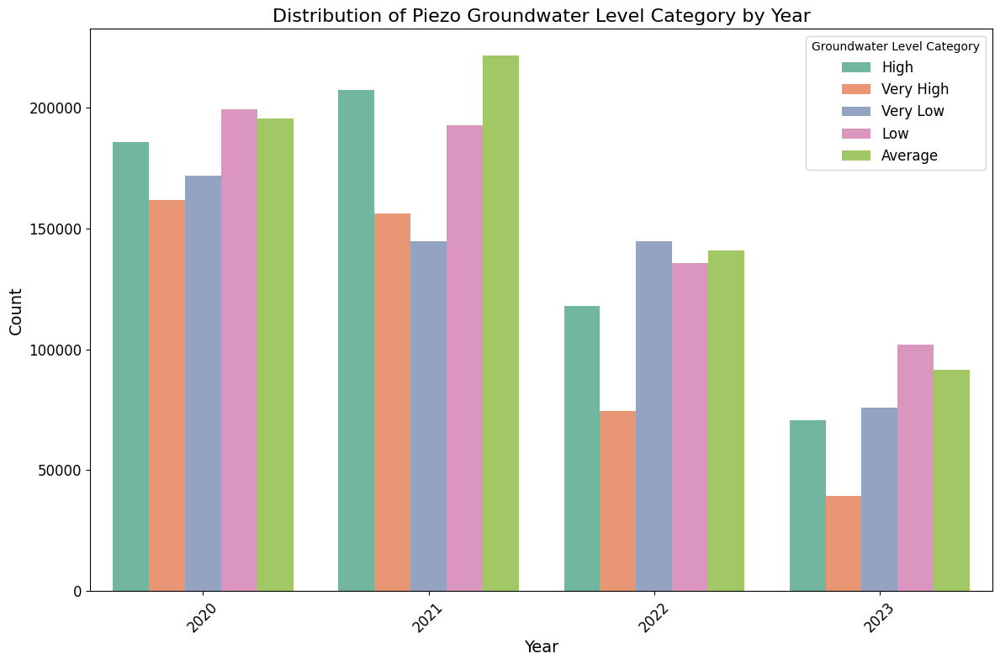

In [8]:
import matplotlib.pyplot as plt

# Ensure the year column is correctly extracted
if 'update_year' not in train.columns:
    train['update_year'] = pd.to_datetime(train['piezo_measurement_date'], errors='coerce').dt.year

# Drop rows with missing years or categories
data_for_distribution = train.dropna(subset=['update_year', 'piezo_groundwater_level_category'])

# Plot the distribution of piezo_groundwater_level_category by year
plt.figure(figsize=(12, 8))
sns.countplot(
    data=data_for_distribution,
    x='update_year',
    hue='piezo_groundwater_level_category',
    palette='Set2'
)

# Add labels and title
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Piezo Groundwater Level Category by Year', fontsize=16)
plt.legend(title='Groundwater Level Category', fontsize=12)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

C:\Users\Bradf\AppData\Local\Temp\ipykernel_25656\657461395.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  nan_counts = combined.groupby(['year', 'month']).apply(lambda x: x.isna().sum().sum())


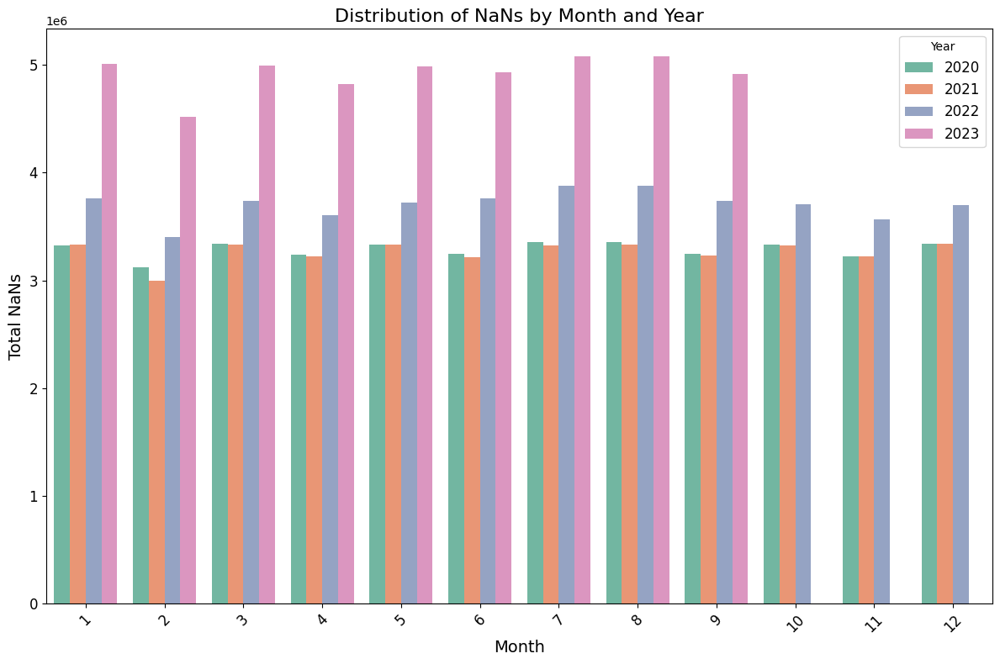

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Combine train and test data for NaN analysis
combined = pd.concat([train, test], keys=['train', 'test'])

# Ensure date column is in datetime format
combined['piezo_measurement_date'] = pd.to_datetime(combined['piezo_measurement_date'], errors='coerce')

# Extract year and month
combined['year'] = combined['piezo_measurement_date'].dt.year
combined['month'] = combined['piezo_measurement_date'].dt.month

# Calculate the number of NaNs per month and per year
nan_counts = combined.groupby(['year', 'month']).apply(lambda x: x.isna().sum().sum())

# Convert to DataFrame
nan_counts = nan_counts.reset_index(name='total_nans')

# Plotting the distribution of NaNs per month and per year
plt.figure(figsize=(12, 8))
sns.barplot(data=nan_counts, x='month', y='total_nans', hue='year', palette='Set2')

plt.xlabel('Month', fontsize=14)
plt.ylabel('Total NaNs', fontsize=14)
plt.title('Distribution of NaNs by Month and Year', fontsize=16)
plt.legend(title='Year', fontsize=12)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

## Data Preprocess with skewness

In [2]:
# Importer les bibliothèques nécessaires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import skew

# Lire les données prétraitées
data = pd.read_csv('data_preprocess.csv')

# Identifier les colonnes numériques
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Fonction pour détecter les outliers et les clipper
def detect_and_clip_outliers(df, numerical_columns):
    # Créer une copie du dataframe pour éviter de modifier les données originales
    df_clipped = df.copy()
    
    for col in numerical_columns:
        # Calculer la skewness pour déterminer si la distribution est symétrique
        col_skewness = df[col].skew()
        
        # Déterminer si la distribution est symétrique ou asymétrique
        if abs(col_skewness) < 0.5:
            # Distribution symétrique : utiliser la méthode IQR
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            
            # Définir les seuils d'outliers
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            method = 'Méthode IQR'
        else:
            # Distribution asymétrique : utiliser les quantiles
            lower_bound = df[col].quantile(0.05)
            upper_bound = df[col].quantile(0.95)
            method = 'Méthode des quantiles (5% et 95%)'
        
        print(f'Clipping de la colonne "{col}" en utilisant {method}. Skewness : {col_skewness:.2f}')
        print(f'Borne inférieure : {lower_bound}, Borne supérieure : {upper_bound}\n')
        
        # Clipper les outliers
        df_clipped[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
        
    return df_clipped

# Fonction pour tracer les variables numériques
def plot_numerical_columns(df, numerical_columns, title_suffix=''):
    num_cols = len(numerical_columns)
    cols_per_row = 2
    rows = math.ceil(num_cols / cols_per_row)
    fig, axes = plt.subplots(rows * 2, cols_per_row, figsize=(20, rows * 5))  # Multiplier les lignes par 2 pour inclure les deux types de plots
    axes = axes.flatten()

    for i, col in enumerate(numerical_columns):
        # Vérifier s'il y a suffisamment de données non nulles pour tracer
        if df[col].dropna().shape[0] > 0:
            # Box plot
            sns.boxplot(x=df[col], ax=axes[i * 2], color='skyblue')
            axes[i * 2].set_title(f'Box Plot de {col} {title_suffix}')
            axes[i * 2].set_xlabel(col)
            
            # Violin plot
            sns.violinplot(x=df[col], ax=axes[i * 2 + 1], color='lightgreen')
            axes[i * 2 + 1].set_title(f'Violin Plot de {col} {title_suffix}')
            axes[i * 2 + 1].set_xlabel(col)
        else:
            axes[i * 2].set_visible(False)
            axes[i * 2 + 1].set_visible(False)

    # Supprimer les sous-plots vides
    total_plots = rows * 2 * cols_per_row
    for j in range(i * 2 + 2, total_plots):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Tracer les variables numériques avant le clipping
print("Tracés avant le clipping des outliers :")
# plot_numerical_columns(data, numerical_cols, title_suffix='(Avant Clipping)')



Tracés avant le clipping des outliers :


In [3]:
# Détecter les outliers et les clipper
data_clipped = detect_and_clip_outliers(data, numerical_cols)

Clipping de la colonne "Unnamed: 0" en utilisant Méthode IQR. Skewness : -0.00
Borne inférieure : -1415157.5, Borne supérieure : 4245472.5

Clipping de la colonne "piezo_station_investigation_depth" en utilisant Méthode des quantiles (5% et 95%). Skewness : 12.92
Borne inférieure : 6.3, Borne supérieure : 265.0

Clipping de la colonne "piezo_station_altitude" en utilisant Méthode des quantiles (5% et 95%). Skewness : 2.35
Borne inférieure : 5.0, Borne supérieure : 445.76

Clipping de la colonne "piezo_station_longitude" en utilisant Méthode IQR. Skewness : 0.38
Borne inférieure : -6.560339470337368, Borne supérieure : 10.652341282202421

Clipping de la colonne "piezo_station_latitude" en utilisant Méthode IQR. Skewness : 0.04
Borne inférieure : 38.92016844296633, Borne supérieure : 53.77520777484163

Clipping de la colonne "piezo_continuity_code" en utilisant Méthode des quantiles (5% et 95%). Skewness : -33.00
Borne inférieure : 2.0, Borne supérieure : 2.0

Clipping de la colonne "met

In [4]:
# Tracer les variables numériques après le clipping
print("Tracés après le clipping des outliers :")
# plot_numerical_columns(data_clipped, numerical_cols, title_suffix='(Après Clipping)')

# Enregistrer les données clippées si nécessaire
data_clipped.to_csv('data_processed_clipped_asymetry_symetry.csv', index=False)

Tracés après le clipping des outliers :


### Data Preprocess

In [10]:
########

# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Read the preprocessed data
data = pd.read_csv('data_preprocess.csv')

# Identify numerical columns
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Function to detect outliers and clip them
def detect_and_clip_outliers(df, numerical_columns):
    # Create a copy of the dataframe to avoid modifying the original data
    df_clipped = df.copy()
    
    for col in numerical_columns:
        # Calculate Q1, Q3, and IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define the outlier thresholds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Clip the outliers
        df_clipped[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
        
    return df_clipped

# Plot violin plots and box plots for numerical columns
def plot_numerical_columns(df, numerical_columns):
    num_cols = len(numerical_columns)
    cols_per_row = 2
    rows = math.ceil(num_cols / cols_per_row)
    fig, axes = plt.subplots(rows * 2, cols_per_row, figsize=(20, rows * 10))  # Multiply rows by 2 to accommodate both plots
    axes = axes.flatten()

    for i, col in enumerate(numerical_columns):
        # Original data box plot
        sns.boxplot(x=df[col], ax=axes[i * 2])
        axes[i * 2].set_title(f'Box Plot of {col}')
        axes[i * 2].set_xlabel(col)
        
        # Original data violin plot
        sns.violinplot(x=df[col], ax=axes[i * 2 + 1])
        axes[i * 2 + 1].set_title(f'Violin Plot of {col}')
        axes[i * 2 + 1].set_xlabel(col)

    # Remove empty subplots
    for j in range(i * 2 + 2, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Plot the numerical columns before clipping
print("Plots before clipping outliers:")
plot_numerical_columns(data, numerical_cols)

Plots before clipping outliers:


In [11]:
# Detect outliers and clip them
data_clipped = detect_and_clip_outliers(data, numerical_cols)

In [12]:
# Plot the numerical columns after clipping
print("Plots after clipping outliers:")
plot_numerical_columns(data_clipped, numerical_cols)

Plots after clipping outliers:


In [13]:

# Save the processed data
data_clipped.to_csv('data_processed_clipped.csv', index=False)


## ExtraTrees

In [ ]:
## extra trees

from sklearn.ensemble import ExtraTreesClassifier
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# # Train the model
train = pd.read_csv('X_train_Hi5.csv', nrows=50_000)  # Load the entire dataset
test = pd.read_csv('X_test_Hi5.csv', nrows=10_000)    # Load the entire dataset


# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# Preprocess training data
X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# Preprocess test data using the same preprocessor
X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Train the model
model = ExtraTreesClassifier(n_estimators=100, random_state=42)
model.fit(X_tr, y_tr)

# Make predictions
train_preds = model.predict(X_tr)
val_preds = model.predict(X_val)

# Evaluate the model (weighted f1-score)
train_score = f1_score(y_tr, train_preds, average='weighted')
print(f'Train F1 Score: {train_score:.4f}')

val_score = f1_score(y_val, val_preds, average='weighted')
print(f'Validation F1 Score: {val_score:.4f}')

# make predictions on test data
test_preds = model.predict(X_test)
test_preds = label_encoder.inverse_transform(test_preds)

# Create a DataFrame for submission or further analysis
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Use the index if 'row_index' does not exist
    'piezo_groundwater_level_category': test_preds
})

test_predictions.to_csv('y_test_Hi5_ExtraTree.csv', index=False)


## Random Forest smartly (50% train /50% test summer / 80% train /20% test non-summer)

In [8]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder


# Load the data
train = pd.read_csv('X_train_Hi5.csv', nrows=400_000)  # Load the entire dataset
test = pd.read_csv('X_test_Hi5.csv', nrows=10_000)    # Load the entire dataset

# train = pd.read_csv('X_train_Hi5.csv')  # Load the entire dataset
# test = pd.read_csv('X_test_Hi5.csv')    # Load the entire dataset

# Shuffle train and test datasets
# train = train.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle entire training data
# test = test.sample(frac=1, random_state=42).reset_index(drop=True)    # Shuffle entire test data

# Select the first 100,000 rows for train and first 2,000 rows for test
# train = train.iloc[:100_000]
# test = test.iloc[:2_000]

# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    # date_cols = [col for col in df.columns if 'date' in col.lower()]
    # for col in date_cols:
    #     df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# # Preprocess training data
# X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# # Preprocess test data using the same preprocessor
# X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# label_encoder = LabelEncoder()
# y_train_encoded = label_encoder.fit_transform(y_train)

# Convert date columns to datetime
date_cols = [col for col in train.columns if 'date' in col.lower()]
for col in date_cols:
    train[col] = pd.to_datetime(train[col], errors='coerce')

# Extraire le mois
train['month'] = train['piezo_measurement_date'].dt.month

# Définir les mois d'été
summer_months = [6, 7, 8]

# Séparer les données d'été et les autres
summer_data = train[train['month'].isin(summer_months)]
other_data = train[~train['month'].isin(summer_months)]

# Split des données d'été : 50% train, 50% validation
summer_train, summer_val = train_test_split(summer_data, test_size=0.5, random_state=42)

# Split des autres données : 80% train, 20% validation
other_train, other_val = train_test_split(other_data, test_size=0.2, random_state=42)

# Combiner les ensembles
train_final = pd.concat([summer_train, other_train])
validation_final = pd.concat([summer_val, other_val])

# Vérifier les proportions
print(f"Ensemble d'entraînement : {train_final.shape[0]} lignes")
print(f"Ensemble de validation : {validation_final.shape[0]} lignes")

# Optionnel : Réinitialiser les index
train_final = train_final.reset_index(drop=True)
validation_final = validation_final.reset_index(drop=True)

# Prétraitement des données
# Supposons que vous avez une fonction preprocess_data qui prend un DataFrame et renvoie X et y

# Prétraitement sur l'ensemble d'entraînement final
X_train, y_train, preprocessor = preprocess_data(train_final, is_train=True)

# Prétraitement sur l'ensemble de validation
X_val, y_val, _ = preprocess_data(validation_final, preprocessor=preprocessor, is_train=False)


clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

clf.fit(X_train, y_train)

# Prédire sur l'ensemble de validation
y_val_pred = clf.predict(X_val)

# Calculer le F1 score pondéré
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score sur l'ensemble de validation : {f1:.4f}")

# Entraînement final sur l'ensemble du dataset d'entraînement
X_train_full, y_train_full, preprocessor = preprocess_data(train, is_train=True)

clf_final = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

clf_final.fit(X_train_full, y_train_full)

# Prédiction sur le dataset test
X_test, _ = preprocess_data(test, preprocessor=preprocessor, is_train=False)

y_test_pred = clf_final.predict(X_test)


# Assurez-vous que le LabelEncoder est ajusté sur l'ensemble d'entraînement complet
label_encoder = LabelEncoder()
label_encoder.fit(train['piezo_groundwater_level_category'])

y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Créer un DataFrame pour la soumission
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Utiliser l'index si 'row_index' n'existe pas
    'piezo_groundwater_level_category': y_test_pred_labels
})

# Enregistrer les prédictions dans un fichier CSV
test_predictions.to_csv('y_test_Hi5_RF_submission.csv', index=False)

print("Soumission finale enregistrée sous 'y_test_Hi5_RF_submission.csv'")

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

## Random Forest

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier

# Load the data
train = pd.read_csv('X_train_Hi5.csv', nrows=50_000)  # Load the entire dataset
test = pd.read_csv('X_test_Hi5.csv', nrows=10_000)    # Load the entire dataset

# Shuffle train and test datasets
# train = train.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle entire training data
# test = test.sample(frac=1, random_state=42).reset_index(drop=True)    # Shuffle entire test data

# Select the first 100,000 rows for train and first 2,000 rows for test
# train = train.iloc[:100_000]
# test = test.iloc[:2_000]

# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# Preprocess training data
X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# Preprocess test data using the same preprocessor
X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Initialize the LightGBM classifier
clf = RandomForestClassifier(
    n_estimators=100,  # Nombre d'arbres dans la forêt
    max_depth=None,    # Profondeur maximale des arbres (None signifie pas de limite)
    random_state=42,   # Graine pour la reproductibilité
    n_jobs=-1          # Utiliser tous les cœurs disponibles pour l'entraînement
)

# Train the model
clf.fit(X_tr, y_tr)

# Predict on validation set
y_val_pred = clf.predict(X_val)

# Calculate weighted F1 score
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# Predict on test data
y_test_pred = clf.predict(X_test)

# If you need to convert predictions back to original labels
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Create a DataFrame for submission or further analysis
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Use the index if 'row_index' does not exist
    'piezo_groundwater_level_category': y_test_pred_labels
})

submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})

# Enregistrer les prédictions dans un fichier CSV

test_predictions.to_csv('y_test_Hi5_RF.csv', index=False)
# print(test_predictions.head())

In [ ]:
import matplotlib.pyplot as plt

# Extract feature importances
feature_importances = clf.feature_importances_

# Get the feature names from the preprocessor
numerical_features = preprocessor.transformers_[0][2]  # Numerical column names
categorical_features = preprocessor.transformers_[1][1]['encoder'].get_feature_names_out(preprocessor.transformers_[1][2])  # Encoded categorical features

# Combine numerical and categorical feature names
feature_names = list(numerical_features) + list(categorical_features)
feature_names = [name for name in feature_names if name != 'insee_%_const_nan']

# # Create a DataFrame for feature importances
# importance_df = pd.DataFrame({
#     'Feature': feature_names,
#     'Importance': feature_importances
# }).sort_values(by='Importance', ascending=False)

# Vérification des longueurs
print(f"Nombre de noms de features : {len(feature_names)}")
print(f"Nombre d'importances : {len(feature_importances)}")

# Assurez-vous que les longueurs correspondent
if len(feature_names) == len(feature_importances):
    # Créer un DataFrame pour les importances
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)

    # Plot des importances
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Importance', fontsize=14)
    plt.ylabel('Feature', fontsize=14)
    plt.title('Feature Importances from Random Forest', fontsize=16)
    plt.gca().invert_yaxis()  # Inverser l'axe y pour avoir les features les plus importantes en haut
    plt.tight_layout()
    plt.show()
else:
    print("Erreur : Les longueurs des noms de features et des importances ne correspondent pas.")
    extra_features = feature_names[len(feature_importances):]
    print("Colonnes en trop :")
    print(extra_features)

# # Plot feature importances
# plt.figure(figsize=(10, 6))
# plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
# plt.xlabel('Importance', fontsize=14)
# plt.ylabel('Feature', fontsize=14)
# plt.title('Feature Importances from Random Forest', fontsize=16)
# plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
# plt.tight_layout()
# plt.show()


In [ ]:
# Filtrer les N features les plus importantes
N = 45  # Modifier pour ajuster
top_features = importance_df.head(N)

# Plot limité aux top N features
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title(f'Top {N} Feature Importances from Random Forest', fontsize=16)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [ ]:
# Filtrer les N features les moins importantes
N = 45  # Nombre de features à afficher
worst_features = importance_df.tail(N)
print(worst_features)
# Plot limité aux N pires features
plt.figure(figsize=(10, 6))
plt.barh(worst_features['Feature'], worst_features['Importance'], color='skyblue')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title(f'Bottom {N} Feature Importances from Random Forest', fontsize=16)
plt.gca().invert_yaxis()  # Inverser l'axe y pour avoir les moins importantes en haut
plt.tight_layout()
plt.show()


In [ ]:
low_importance_threshold = 0.001
low_importance_features = importance_df[importance_df['Importance'] < low_importance_threshold]['Feature']

# Supprimer ces features du dataset
columns_to_drop = low_importance_features.tolist()
train = train.drop(columns=columns_to_drop, errors='ignore')
test = test.drop(columns=columns_to_drop, errors='ignore')

In [ ]:
# size of train and test data

print(f"Train data shape: {train.shape}")
print(f"Test data shape: {test.shape}")

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
# Load the data (limiting to 10,000 rows for speed)
# train = pd.read_csv('X_train_Hi5.csv', nrows=100000)
# test = pd.read_csv('X_test_Hi5.csv', nrows=2000)

# Load the data
# train = pd.read_csv('X_train_Hi5.csv', nrows=50_000)  # Load the entire dataset
# test = pd.read_csv('X_test_Hi5.csv', nrows=10_000)    # Load the entire dataset

# Shuffle train and test datasets
# train = train.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle entire training data
# test = test.sample(frac=1, random_state=42).reset_index(drop=True)    # Shuffle entire test data

# Select the first 100,000 rows for train and first 2,000 rows for test
# train = train.iloc[:100_000]
# test = test.iloc[:2_000]

# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# Preprocess training data
X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# Preprocess test data using the same preprocessor
X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Initialize the LightGBM classifier
clf = RandomForestClassifier(
    n_estimators=100,  # Nombre d'arbres dans la forêt
    max_depth=None,    # Profondeur maximale des arbres (None signifie pas de limite)
    random_state=42,   # Graine pour la reproductibilité
    n_jobs=-1          # Utiliser tous les cœurs disponibles pour l'entraînement
)

# Train the model
clf.fit(X_tr, y_tr)

# Predict on validation set
y_val_pred = clf.predict(X_val)

# Calculate weighted F1 score
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# Predict on test data
y_test_pred = clf.predict(X_test)

# If you need to convert predictions back to original labels
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Create a DataFrame for submission or further analysis
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Use the index if 'row_index' does not exist
    'piezo_groundwater_level_category': y_test_pred_labels
})

submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})

# Enregistrer les prédictions dans un fichier CSV

test_predictions.to_csv('y_test_Hi5_RF.csv', index=False)
# print(test_predictions.head())

## CatBoost

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from catboost import CatBoostClassifier, Pool
from sklearn.preprocessing import LabelEncoder

# Load the data (limiting to 10,000 rows for speed)
# train = pd.read_csv('X_train_Hi5.csv', nrows=100000)
# test = pd.read_csv('X_test_Hi5.csv', nrows=2000)

# Load the data
train = pd.read_csv('X_train_Hi5.csv', nrows=400_000)  # Load the entire dataset
test = pd.read_csv('X_test_Hi5.csv', nrows=2_000)    # Load the entire dataset

# Shuffle train and test datasets
train = train.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle entire training data
test = test.sample(frac=1, random_state=42).reset_index(drop=True)    # Shuffle entire test data

# Select the first 100,000 rows for train and first 2,000 rows for test
train = train.iloc[:100_000]
test = test.iloc[:2_000]

# Function to preprocess data
def preprocess_data(df, is_train=True, feature_columns=None, categorical_cols=None):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Handle date columns
    # We can extract features from dates
    for col in date_cols:
        df[col + '_year'] = df[col].dt.year
        df[col + '_month'] = df[col].dt.month
        df[col + '_day'] = df[col].dt.day
        df[col + '_dayofweek'] = df[col].dt.dayofweek
        df[col + '_dayofyear'] = df[col].dt.dayofyear
        df[col + '_is_weekend'] = df[col].dt.dayofweek > 4
        # Drop original date columns
        df.drop(col, axis=1, inplace=True)

    # Identify numerical and categorical columns
    if is_train:
        numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
        categorical_cols = df.select_dtypes(include=['object', 'bool']).columns.tolist()

        # Remove target variable from features if it's in the dataset
        target = 'piezo_groundwater_level_category'
        if target in df.columns:
            if target in numerical_cols:
                numerical_cols.remove(target)
            if target in categorical_cols:
                categorical_cols.remove(target)

        # Convert categorical columns to strings
        df[categorical_cols] = df[categorical_cols].astype(str)

        y = df[target] if target in df.columns else None
        X = df.drop(target, axis=1) if target in df.columns else df
        feature_columns = X.columns.tolist()
        return X, y, categorical_cols, feature_columns
    else:
        # Ensure consistent columns between train and test
        df[categorical_cols] = df[categorical_cols].astype(str)
        X = df
        missing_cols = set(feature_columns) - set(X.columns)
        for col in missing_cols:
            X[col] = np.nan
        X = X[feature_columns]
        return X

# Preprocess training data
X_train, y_train, categorical_cols, feature_columns = preprocess_data(train, is_train=True)

# Preprocess test data using the same columns
X_test = preprocess_data(test, is_train=False, feature_columns=feature_columns, categorical_cols=categorical_cols)

# Encode target variable if it's categorical
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Get categorical feature indices for CatBoost
cat_features = [X_train.columns.get_loc(col) for col in categorical_cols]

# Initialize the CatBoost classifier
clf = CatBoostClassifier(
    iterations=100,
    learning_rate=0.1,
    random_seed=42,
    eval_metric='MultiClass',
    verbose=10
)

# Prepare Pool objects for CatBoost
train_pool = Pool(data=X_tr, label=y_tr, cat_features=cat_features)
val_pool = Pool(data=X_val, label=y_val, cat_features=cat_features)
test_pool = Pool(data=X_test, cat_features=cat_features)

# Train the model
clf.fit(
    train_pool,
    eval_set=val_pool,
    early_stopping_rounds=10
)

# Predict on validation set
y_val_pred = clf.predict(val_pool)
y_val_pred = y_val_pred.flatten().astype(int)

# Calculate weighted F1 score
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# Predict on test data
y_test_pred = clf.predict(test_pool)
y_test_pred = y_test_pred.flatten().astype(int)

# If you need to convert predictions back to original labels
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Create a DataFrame for submission or further analysis
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Use the index if 'row_index' does not exist
    'piezo_groundwater_level_category': y_test_pred_labels
})

submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})

# Save the predictions to a CSV file
test_predictions.to_csv('y_test_Hi5_CatBoost.csv', index=False)


## LGBM only 10k samples

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
import lightgbm as lgb

# Load the data (limiting to 10,000 rows for speed)
# train = pd.read_csv('X_train_Hi5.csv', nrows=100000)
# test = pd.read_csv('X_test_Hi5.csv', nrows=2000)

# Load the data
train = pd.read_csv('X_train_Hi5.csv', nrows=400_000)  # Load the entire dataset
test = pd.read_csv('X_test_Hi5.csv', nrows=2_000)    # Load the entire dataset

# Shuffle train and test datasets
train = train.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle entire training data
test = test.sample(frac=1, random_state=42).reset_index(drop=True)    # Shuffle entire test data

# Select the first 100,000 rows for train and first 2,000 rows for test
train = train.iloc[:100_000]
test = test.iloc[:2_000]

# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# Preprocess training data
X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# Preprocess test data using the same preprocessor
X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Initialize the LightGBM classifier
clf = lgb.LGBMClassifier(
    boosting_type='gbdt',
    objective='multiclass',
    num_class=len(np.unique(y_train_encoded)),
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)

# Train the model
clf.fit(X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        eval_metric='multi_logloss')

# Predict on validation set
y_val_pred = clf.predict(X_val)

# Calculate weighted F1 score
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# Predict on test data
y_test_pred = clf.predict(X_test)

# If you need to convert predictions back to original labels
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Create a DataFrame for submission or further analysis
test_predictions = pd.DataFrame({
    'row_index': test.index,  # Use the index if 'row_index' does not exist
    'piezo_groundwater_level_category': y_test_pred_labels
})

submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})

# Enregistrer les prédictions dans un fichier CSV

test_predictions.to_csv('y_test_Hi5_LGBM.csv', index=False)
# print(test_predictions.head())


## LGBM conidering all the data : overflows

In [ ]:


# # Import necessary libraries
# import pandas as pd
# import numpy as np
# from sklearn.pipeline import Pipeline
# from sklearn.preprocessing import OneHotEncoder, StandardScaler
# from sklearn.impute import SimpleImputer
# from sklearn.compose import ColumnTransformer
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import f1_score
# import lightgbm as lgb

# # Load the data
# train = pd.read_csv('X_train_Hi5.csv')
# test = pd.read_csv('X_test_Hi5.csv')

# # Function to preprocess data
# def preprocess_data(df, preprocessor=None, is_train=True):
#     # Convert date columns to datetime
#     date_cols = [col for col in df.columns if 'date' in col.lower()]
#     for col in date_cols:
#         df[col] = pd.to_datetime(df[col], errors='coerce')

#     # Identify numerical and categorical columns
#     numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
#     categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

#     # Remove target variable from features if it's in the dataset
#     target = 'piezo_groundwater_level_category'
#     if target in df.columns:
#         if target in numerical_cols:
#             numerical_cols.remove(target)
#         if target in categorical_cols:
#             categorical_cols.remove(target)

#     # Convert categorical columns to strings
#     df[categorical_cols] = df[categorical_cols].astype(str)

#     # Imputation strategies
#     num_imputer = SimpleImputer(strategy='median')
#     cat_imputer = SimpleImputer(strategy='most_frequent')

#     # Scaling
#     scaler = StandardScaler()

#     # Encoding categorical variables
#     cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

#     # Build pipelines for numerical and categorical data
#     num_pipeline = Pipeline([
#         ('imputer', num_imputer),
#         ('scaler', scaler)
#     ])

#     cat_pipeline = Pipeline([
#         ('imputer', cat_imputer),
#         ('encoder', cat_encoder)
#     ])

#     # Combine numerical and categorical pipelines
#     if preprocessor is None:
#         preprocessor = ColumnTransformer([
#             ('num', num_pipeline, numerical_cols),
#             ('cat', cat_pipeline, categorical_cols)
#         ], remainder='drop')  # Drop any columns not specified
#     else:
#         # Update the transformers with the correct columns
#         preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
#         preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

#     if is_train:
#         # Fit and transform the data
#         X = preprocessor.fit_transform(df)
#         y = df[target] if target in df.columns else None
#         return X, y, preprocessor
#     else:
#         # Transform the data using the existing preprocessor
#         X = preprocessor.transform(df)
#         return X

# # Preprocess training data
# X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# # Preprocess test data using the same preprocessor
# X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# # Encode target variable if it's categorical
# from sklearn.preprocessing import LabelEncoder
# label_encoder = LabelEncoder()
# y_train_encoded = label_encoder.fit_transform(y_train)

# # Split the data into training and validation sets
# X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# # Initialize the LightGBM classifier
# clf = lgb.LGBMClassifier(
#     boosting_type='gbdt',
#     objective='multiclass',
#     num_class=len(np.unique(y_train_encoded)),
#     n_estimators=100,
#     learning_rate=0.1,
#     random_state=42
# )

# # Train the model
# clf.fit(X_tr, y_tr,
#         eval_set=[(X_val, y_val)],
#         eval_metric='multi_logloss')

# # Predict on validation set
# y_val_pred = clf.predict(X_val)

# # Calculate weighted F1 score
# f1 = f1_score(y_val, y_val_pred, average='weighted')
# print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# # Predict on test data
# y_test_pred = clf.predict(X_test)

# # If you need to convert predictions back to original labels
# y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# # Create a DataFrame for submission or further analysis
# test_predictions = pd.DataFrame({
#     'row_index': test.index,  # Use the index if 'row_index' does not exist
#     'piezo_groundwater_level_category': y_test_pred_labels
# })

# submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})

# # Enregistrer les prédictions dans un fichier CSV

# submission.to_csv('y_test_Hi5_LGBM_all.csv', index=False)
# # print(test_predictions.head())


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from xgboost import XGBClassifier

# Load the data (limiting to 10,000 rows for speed)
train = pd.read_csv('X_train_Hi5.csv', nrows=10000)
test = pd.read_csv('X_test_Hi5.csv', nrows=10000)

# Function to preprocess data
def preprocess_data(df, preprocessor=None, is_train=True):
    # Convert date columns to datetime
    date_cols = [col for col in df.columns if 'date' in col.lower()]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')

    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target variable from features if it's in the dataset
    target = 'piezo_groundwater_level_category'
    if target in df.columns:
        if target in numerical_cols:
            numerical_cols.remove(target)
        if target in categorical_cols:
            categorical_cols.remove(target)

    # Convert categorical columns to strings
    df[categorical_cols] = df[categorical_cols].astype(str)

    # Imputation strategies
    num_imputer = SimpleImputer(strategy='median')
    cat_imputer = SimpleImputer(strategy='most_frequent')

    # Scaling
    scaler = StandardScaler()

    # Encoding categorical variables
    cat_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

    # Build pipelines for numerical and categorical data
    num_pipeline = Pipeline([
        ('imputer', num_imputer),
        ('scaler', scaler)
    ])

    cat_pipeline = Pipeline([
        ('imputer', cat_imputer),
        ('encoder', cat_encoder)
    ])

    # Combine numerical and categorical pipelines
    if preprocessor is None:
        preprocessor = ColumnTransformer([
            ('num', num_pipeline, numerical_cols),
            ('cat', cat_pipeline, categorical_cols)
        ], remainder='drop')  # Drop any columns not specified
    else:
        # Update the transformers with the correct columns
        preprocessor.transformers[0] = ('num', num_pipeline, numerical_cols)
        preprocessor.transformers[1] = ('cat', cat_pipeline, categorical_cols)

    if is_train:
        # Fit and transform the data
        X = preprocessor.fit_transform(df)
        y = df[target] if target in df.columns else None
        return X, y, preprocessor
    else:
        # Transform the data using the existing preprocessor
        X = preprocessor.transform(df)
        return X

# Preprocess training data
X_train, y_train, preprocessor = preprocess_data(train, is_train=True)

# Preprocess test data using the same preprocessor
X_test = preprocess_data(test, preprocessor=preprocessor, is_train=False)

# Encode target variable if it's categorical
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Split the data into training and validation sets
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train_encoded, test_size=0.2, random_state=42)

# Initialize the XGBoost classifier
clf = XGBClassifier(
    objective='multi:softmax',
    num_class=len(np.unique(y_train_encoded)),
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    random_state=42,
    eval_metric='mlogloss',  # Déplacer ici
    use_label_encoder=False
)

# Train the model
clf.fit(X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        verbose=True)

# Predict on validation set
y_val_pred = clf.predict(X_val)

# Calculate weighted F1 score
f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Weighted F1 Score on Validation Set: {f1:.4f}")

# Predict on test data
y_test_pred = clf.predict(X_test)

# If you need to convert predictions back to original labels
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

# Save predictions to a CSV file
submission = pd.DataFrame({'piezo_groundwater_level_category': y_test_pred_labels})
submission.to_csv('y_test_Hi5_xgboost.csv', index=False)


----------------

**(A NE PAS TOUCHER EN DESSOUS, PUREMENT UN TEST)**

In [ ]:
# load the train and test file

import pandas as pd

train = pd.read_csv('X_train_Hi5.csv')
test = pd.read_csv('X_test_Hi5.csv')

In [ ]:
#Looking for piezo_station_bss_code is unique
D = {}
for i in range(train.shape[0]):
    if (train["piezo_measurement_date"][i],train["piezo_station_longitude"][i],train["piezo_station_latitude"][i], train["piezo_station_commune_name"][i]) not in D:
        D[(train["piezo_measurement_date"][i],train["piezo_station_longitude"][i],train["piezo_station_latitude"][i], train["piezo_station_commune_name"][i] )] = 1
    else:
        D[(train["piezo_measurement_date"][i],train["piezo_station_longitude"][i],train["piezo_station_latitude"][i], train["piezo_station_commune_name"][i] )] +=1

for elt in D:
    if D[elt] > 1:
        print(f"BSS Code: {elt[1] - elt[2]}, Date: {elt[0]}, Nombre de mesure: {D[elt]}")
# train[(train["piezo_bss_id"]==46.7631741819176) & (train["piezo_station_longitude"]==0.101953968228974) & (train["piezo_measurement_date"]=="2023-05-31")]

In [ ]:
print((train.shape, test.shape))

In [ ]:
import pandas as pd 
pd.set_option('display.max_columns', 136)

In [ ]:
# how is the target variable balanced or not

print(train['piezo_groundwater_level_category'].value_counts())

#  plot histograms

import matplotlib.pyplot as plt

train['piezo_groundwater_level_category'].hist(bins=50, figsize=(20,15))
plt.show()

In [ ]:
# Identifier les colonnes avec des valeurs manquantes
missing_values = train.isna().sum()
missing_values = missing_values[missing_values > 0]
print("Colonnes avec des valeurs manquantes :")
print(missing_values)

In [ ]:
import matplotlib.pyplot as plt

# Visualisation de la distribution pour les données numériques
numeric_cols = train.select_dtypes(include=['float64', 'int64']).columns

for col in numeric_cols:
    if train[col].isna().sum() > 0:  # Ne tracer que les colonnes avec des valeurs manquantes
        plt.figure(figsize=(10, 5))
        train[col].hist(bins=30, alpha=0.7)
        plt.title(f"Distribution of {col}")
        plt.show()

# Vérifier les valeurs uniques pour les colonnes catégoriques avec des données manquantes
categorical_cols = train.select_dtypes(include=['object']).columns
for col in categorical_cols:
    if train[col].isna().sum() > 0:
        print(f"Colonne {col}: {train[col].value_counts()}")


In [ ]:
# Identifier les colonnes avec des valeurs manquantes
missing_values_test = test.isna().sum()
missing_values_test = missing_values_test[missing_values_test > 0]
print("Colonnes avec des valeurs manquantes :")
print(missing_values_test)

In [ ]:
# Remplissage des données numériques
for col in numeric_cols:
    if train[col].isna().sum() > 0:
        if train[col].skew() < 0.5:  # Distribution symétrique
            train[col].fillna(train[col].mean(), inplace=True)
        else:  # Distribution biaisée
            train[col].fillna(train[col].median(), inplace=True)

# # Interpolation pour séries temporelles
# time_cols = ['piezo_station_update_date', 'piezo_measurement_date']
# train[time_cols] = pd.to_datetime(train[time_cols])  # Convertir en datetime
# train.sort_values(by='piezo_station_update_date', inplace=True)  # Trier par temps
# for col in numeric_cols:
#     if train[col].isna().sum() > 0:
#         train[col] = train[col].interpolate(method='time')

# Remplissage des données catégoriques
for col in categorical_cols:
    if train[col].isna().sum() > 0:
        train[col].fillna(train[col].mode()[0], inplace=True)  # Mode (valeur la plus fréquente)


In [ ]:
# Identifier les colonnes avec des valeurs manquantes
missing_values = train.isna().sum()
missing_values = missing_values[missing_values > 0]
print("Colonnes avec des valeurs manquantes :")
print(missing_values)

In [ ]:
# normalisation des données

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
train[numeric_cols] = scaler.fit_transform(train[numeric_cols])

# Encodage des variables catégoriques

from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
for col in categorical_cols:
    train[col] = encoder.fit_transform(train[col])

# Séparation des données en variables explicatives et cible

X = train.drop(columns=['piezo_groundwater_level_category'])
y = train['piezo_groundwater_level_category']

# # Division des données en ensembles d'entraînement et de test

# from sklearn.model_selection import train_test_split



In [ ]:
# lancer un Light Gradient Boosting Machin (LGBM)

from lightgbm import LGBMClassifier

model = LGBMClassifier()
model.fit(X, y)

# Prédictions sur les données de test

test[numeric_cols] = scaler.transform(test[numeric_cols])

for col in categorical_cols:
    test[col] = encoder.transform(test[col])

predictions = model.predict(test)

# Créer un DataFrame pour les prédictions

submission = pd.DataFrame({'piezo_groundwater_level_category': predictions})

# Enregistrer les prédictions dans un fichier CSV

submission.to_csv('submission.csv', index=False)